In [25]:
import torch

import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.preprocessing import MinMaxScaler
from pandas.plotting import register_matplotlib_converters
from torch import nn, optim

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 14, 10
register_matplotlib_converters()

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

# Analysis on dataset: total-and-daily-cases-covid-19

In [2]:
covid_df = pd.read_csv('total-and-daily-cases-covid-19.csv')

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [4]:
covid_df

,Entity,Code,Date,Total confirmed cases (cases),Daily new confirmed cases (cases)
0,Afghanistan,AFG,"Dec 31, 2019",0,0
1,Afghanistan,AFG,"Jan 1, 2020",0,0
2,Afghanistan,AFG,"Jan 2, 2020",0,0
3,Afghanistan,AFG,"Jan 3, 2020",0,0
4,Afghanistan,AFG,"Jan 4, 2020",0,0
5,Afghanistan,AFG,"Jan 5, 2020",0,0
6,Afghanistan,AFG,"Jan 6, 2020",0,0
7,Afghanistan,AFG,"Jan 7, 2020",0,0
8,Afghanistan,AFG,"Jan 8, 2020",0,0
9,Afghanistan,AFG,"Jan 9, 2020",0,0


In [5]:
india_df = covid_df.loc[covid_df['Entity'] == 'India']

In [6]:
india_df

,Entity,Code,Date,Total confirmed cases (cases),Daily new confirmed cases (cases)
9312,India,IND,"Dec 31, 2019",0,0
9313,India,IND,"Jan 1, 2020",0,0
9314,India,IND,"Jan 2, 2020",0,0
9315,India,IND,"Jan 3, 2020",0,0
9316,India,IND,"Jan 4, 2020",0,0
9317,India,IND,"Jan 5, 2020",0,0
9318,India,IND,"Jan 6, 2020",0,0
9319,India,IND,"Jan 7, 2020",0,0
9320,India,IND,"Jan 8, 2020",0,0
9321,India,IND,"Jan 9, 2020",0,0


In [7]:
india_df.iloc[:,2]

9312    Dec 31, 2019
9313     Jan 1, 2020
9314     Jan 2, 2020
9315     Jan 3, 2020
9316     Jan 4, 2020
9317     Jan 5, 2020
9318     Jan 6, 2020
9319     Jan 7, 2020
9320     Jan 8, 2020
9321     Jan 9, 2020
9322    Jan 10, 2020
9323    Jan 11, 2020
9324    Jan 12, 2020
9325    Jan 13, 2020
9326    Jan 14, 2020
9327    Jan 15, 2020
9328    Jan 16, 2020
9329    Jan 17, 2020
9330    Jan 18, 2020
9331    Jan 19, 2020
9332    Jan 20, 2020
9333    Jan 21, 2020
9334    Jan 22, 2020
9335    Jan 23, 2020
9336    Jan 24, 2020
9337    Jan 25, 2020
9338    Jan 26, 2020
9339    Jan 27, 2020
9340    Jan 28, 2020
9341    Jan 29, 2020
9342    Jan 30, 2020
9343    Jan 31, 2020
9344     Feb 1, 2020
9345     Feb 2, 2020
9346     Feb 3, 2020
9347     Feb 4, 2020
9348     Feb 5, 2020
9349     Feb 6, 2020
9350     Feb 7, 2020
9351     Feb 8, 2020
9352     Feb 9, 2020
9353    Feb 10, 2020
9354    Feb 11, 2020
9355    Feb 12, 2020
9356    Feb 13, 2020
9357    Feb 14, 2020
9358    Feb 15, 2020
9359    Feb 1

In [8]:
daily_cases = india_df[['Date']].copy()
daily_cases['ds'] =  pd.to_datetime(india_df.iloc[:,2])
daily_cases = daily_cases.drop(columns='Date')
daily_cases['y'] = india_df['Daily new confirmed cases (cases)']
daily_cases

,ds,y
9312,2019-12-31,0
9313,2020-01-01,0
9314,2020-01-02,0
9315,2020-01-03,0
9316,2020-01-04,0
9317,2020-01-05,0
9318,2020-01-06,0
9319,2020-01-07,0
9320,2020-01-08,0
9321,2020-01-09,0


In [24]:
daily_cases.tail()

,ds,y
9457,2020-05-25,6977
9458,2020-05-26,6535
9459,2020-05-27,6387
9460,2020-05-28,6566
9461,2020-05-29,7466


In [9]:
#daily_cases.index = pd.to_datetime(daily_cases.Date)
#daily_cases = daily_cases.drop(columns = 'Date')

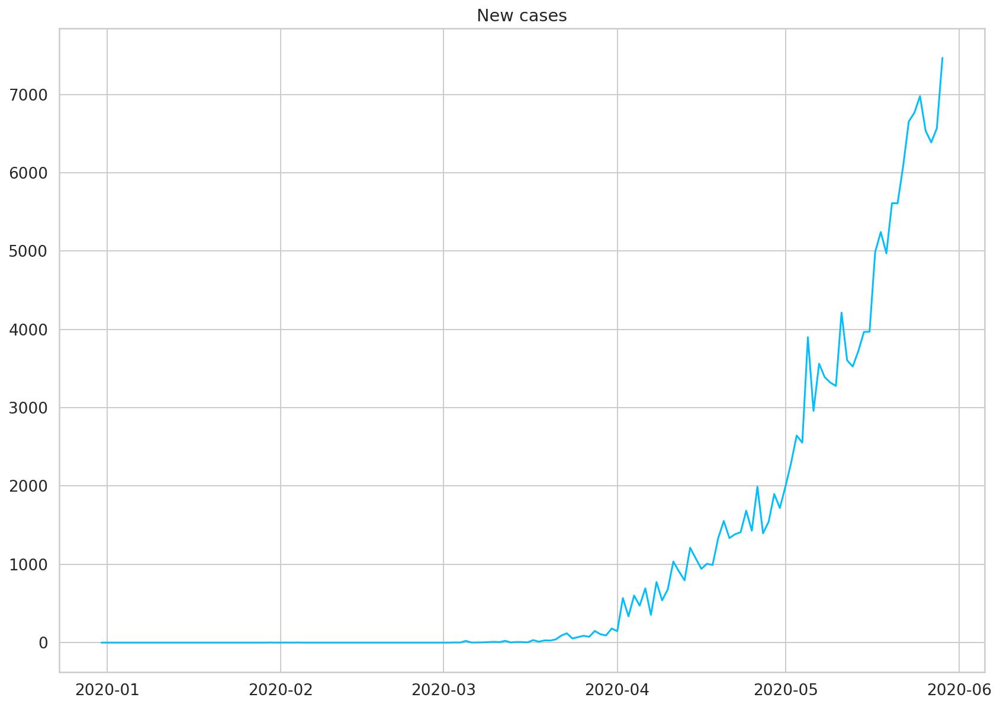

In [10]:
plt.plot(daily_cases['ds'],daily_cases['y'])
plt.title("New cases");

In [11]:
total_cases = india_df[['Date']].copy()
total_cases['ds'] =  pd.to_datetime(india_df.iloc[:,2])
total_cases = total_cases.drop(columns='Date')
total_cases['y'] = india_df['Total confirmed cases (cases)']
total_cases

,ds,y
9312,2019-12-31,0
9313,2020-01-01,0
9314,2020-01-02,0
9315,2020-01-03,0
9316,2020-01-04,0
9317,2020-01-05,0
9318,2020-01-06,0
9319,2020-01-07,0
9320,2020-01-08,0
9321,2020-01-09,0


In [23]:
total_cases.tail()

,ds,y
9457,2020-05-25,138845
9458,2020-05-26,145380
9459,2020-05-27,151767
9460,2020-05-28,158333
9461,2020-05-29,165799


In [12]:
# total_cases.index = pd.to_datetime(total_cases.Date)
# total_cases = total_cases.drop(columns = 'Date')
# total_cases

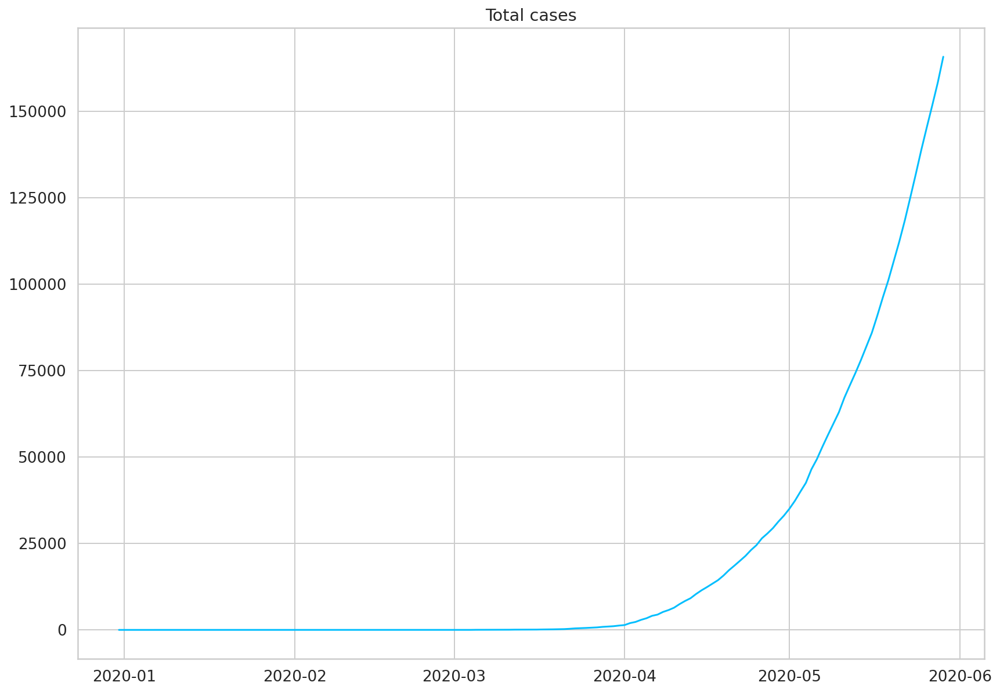

In [13]:
plt.plot(total_cases['ds'],total_cases['y'])
plt.title("Total cases");

In [31]:
from fbprophet import Prophet

In [32]:
m = Prophet(interval_width=0.95)
m.fit(daily_cases)
future = m.make_future_dataframe(periods=14)
future

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
0,2019-12-31
1,2020-01-01
2,2020-01-02
3,2020-01-03
4,2020-01-04
5,2020-01-05
6,2020-01-06
7,2020-01-07
8,2020-01-08
9,2020-01-09


In [70]:
forecast = m.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']].iloc[-15:,:]
futurecases = forecast[['ds','yhat','yhat_lower','yhat_upper']].iloc[-15:,:]

In [81]:
dates = futurecases[['ds']].copy()
dates['newCases'] = futurecases['yhat']
dates['newCasesUpper'] = futurecases['yhat_upper']
Total = []
temp =158333
for val in dates['newCases']:
    temp = temp+val
    Total.append(temp)
dates['TotalCases'] = Total
dates

,ds,newCases,newCasesUpper,TotalCases
149,2020-05-29,6925.835227,7353.398980,165258.835227
150,2020-05-30,7081.478115,7485.377764,172340.313342
151,2020-05-31,7303.230443,7715.223292,179643.543785
152,2020-06-01,7476.824872,7884.560237,187120.368657
153,2020-06-02,7599.698634,7997.348656,194720.067291
154,2020-06-03,7727.085831,8155.804099,202447.153122
155,2020-06-04,7889.276501,8322.075071,210336.429623
156,2020-06-05,8095.335682,8543.715859,218431.765305
157,2020-06-06,8250.978571,8683.776899,226682.743876
158,2020-06-07,8472.730898,8910.984168,235155.474774


In [83]:
Total = []
temp =158333
for val in dates['newCasesUpper']:
    temp = temp+val
    Total.append(temp)
dates['TotalCasesUpper'] = Total
dates

,ds,newCases,newCasesUpper,TotalCases,TotalCasesUpper
149,2020-05-29,6925.835227,7353.398980,165258.835227,165686.398980
150,2020-05-30,7081.478115,7485.377764,172340.313342,173171.776744
151,2020-05-31,7303.230443,7715.223292,179643.543785,180887.000036
152,2020-06-01,7476.824872,7884.560237,187120.368657,188771.560273
153,2020-06-02,7599.698634,7997.348656,194720.067291,196768.908929
154,2020-06-03,7727.085831,8155.804099,202447.153122,204924.713028
155,2020-06-04,7889.276501,8322.075071,210336.429623,213246.788098
156,2020-06-05,8095.335682,8543.715859,218431.765305,221790.503958
157,2020-06-06,8250.978571,8683.776899,226682.743876,230474.280857
158,2020-06-07,8472.730898,8910.984168,235155.474774,239385.265025


In [85]:
df = dates.astype(int)
dates['newCases'] = df['newCases']
dates['newCasesUpper'] = df['newCasesUpper']
dates['TotalCases'] = df['TotalCases']
dates['TotalCasesUpper'] = df['TotalCasesUpper']
dates

,ds,newCases,newCasesUpper,TotalCases,TotalCasesUpper
149,2020-05-29,6925,7353,165258,165686
150,2020-05-30,7081,7485,172340,173171
151,2020-05-31,7303,7715,179643,180887
152,2020-06-01,7476,7884,187120,188771
153,2020-06-02,7599,7997,194720,196768
154,2020-06-03,7727,8155,202447,204924
155,2020-06-04,7889,8322,210336,213246
156,2020-06-05,8095,8543,218431,221790
157,2020-06-06,8250,8683,226682,230474
158,2020-06-07,8472,8910,235155,239385


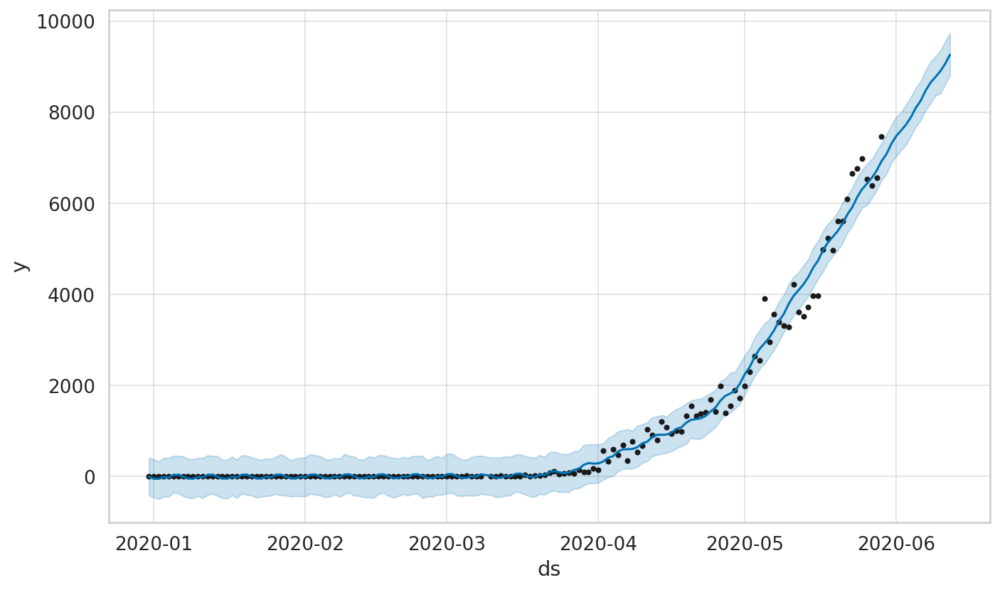

In [17]:
new_cases_forecast = m.plot(forecast)

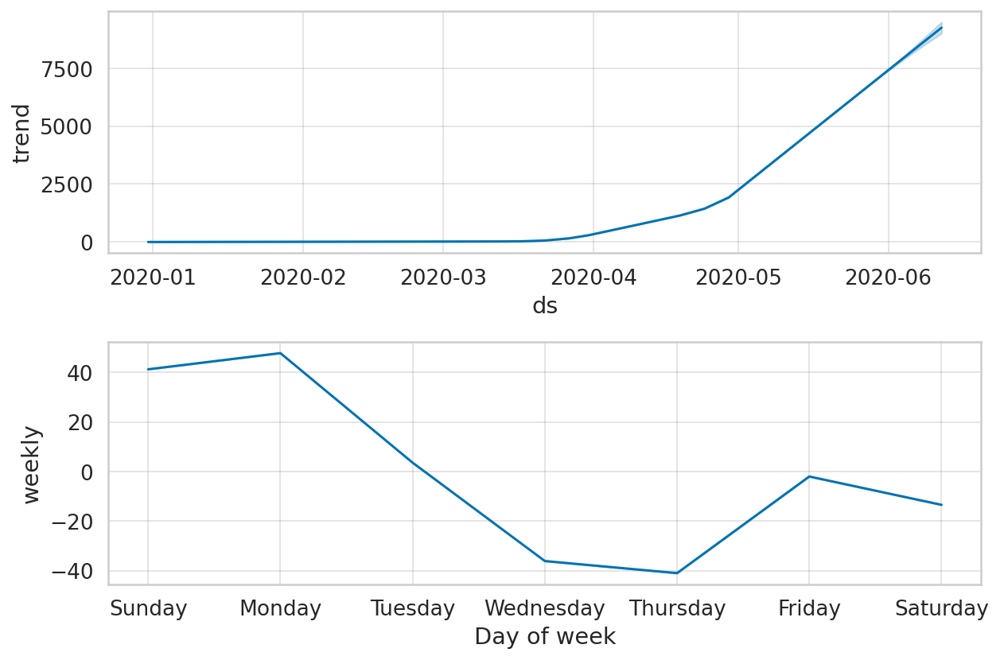

In [18]:
new_cases_forecast = m.plot_components(forecast)

# For total cases uptill 12th june 

In [26]:
m = Prophet(interval_width=0.95)
m.fit(total_cases)
future = m.make_future_dataframe(periods=14)
future

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
0,2019-12-31
1,2020-01-01
2,2020-01-02
3,2020-01-03
4,2020-01-04
5,2020-01-05
6,2020-01-06
7,2020-01-07
8,2020-01-08
9,2020-01-09


In [27]:
forecast = m.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2019-12-31,-97.357909,-6318.881120,6305.572762
1,2020-01-01,51.458398,-6330.717432,6530.686534
2,2020-01-02,91.136604,-6663.113386,5934.050968
3,2020-01-03,217.556043,-6423.723122,6649.494093
4,2020-01-04,-537.612271,-7020.277511,6025.755281
5,2020-01-05,-408.603918,-6281.080521,6035.302066
6,2020-01-06,-247.922171,-6496.373262,6110.634849
7,2020-01-07,-74.044449,-6617.909094,6773.052479
8,2020-01-08,74.771855,-6351.568990,6745.760932
9,2020-01-09,114.450058,-6459.291388,6633.595717


In [30]:
forecast[['ds','yhat','yhat_lower','yhat_upper']].iloc[-15:,:]

,ds,yhat,yhat_lower,yhat_upper
149,2020-05-29,149331.224614,142925.338556,155451.074258
150,2020-05-30,152754.558264,146093.959314,159326.670910
151,2020-05-31,157062.068581,150688.203260,163313.073373
152,2020-06-01,161401.252295,154613.938938,167852.943285
153,2020-06-02,165753.631983,159025.192840,171952.719560
154,2020-06-03,170080.950253,163312.469094,176824.701909
155,2020-06-04,174299.130422,167837.620291,181271.201005
156,2020-06-05,178604.051825,171929.345528,185489.235109
157,2020-06-06,182027.385474,175397.263380,189160.680384
158,2020-06-07,186334.895791,179197.198042,193417.546542


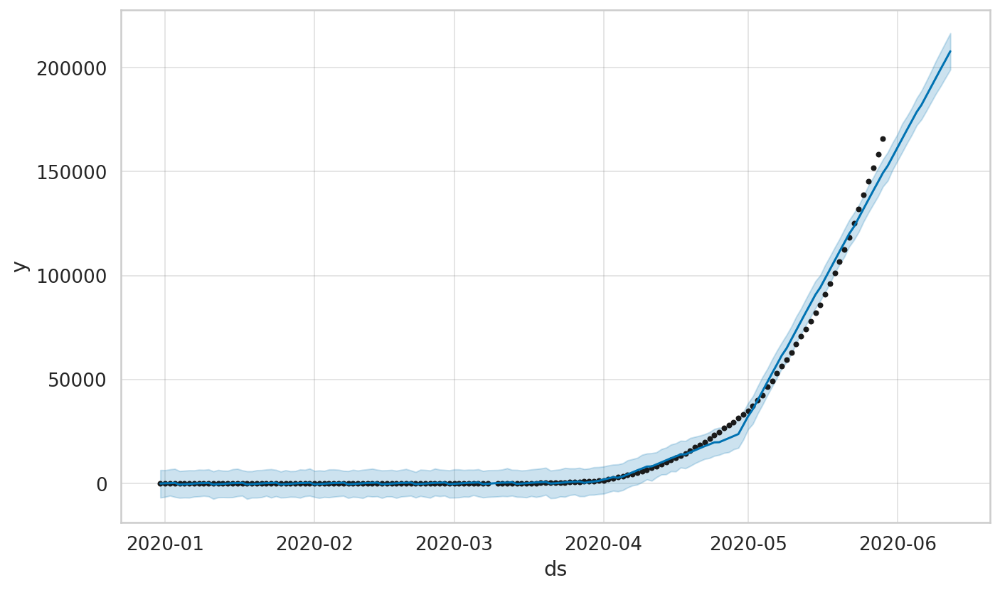

In [21]:
new_cases_forecast = m.plot(forecast)

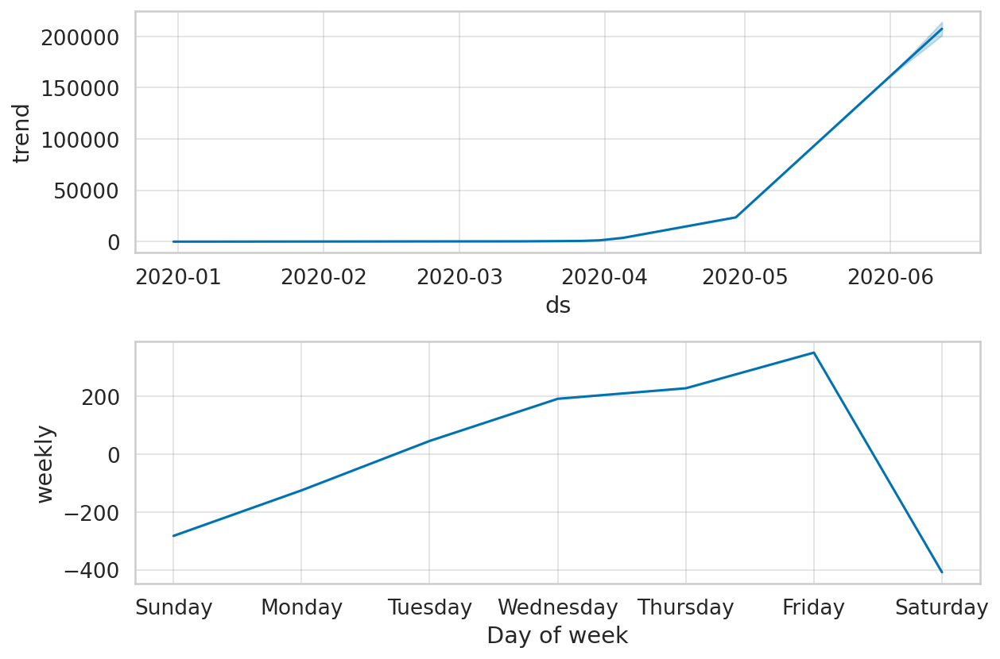

In [22]:
new_cases_forecast = m.plot_components(forecast)